In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd
from white_demura import mean_pooling, run_dfs, run_dfs_green, reconstruct_mask, RGB_mask_no_roi, RGB_mask, sum_contour, read_and_extract_roi, apply_mask, get_signal_mapping, generate_mapping, extract_middle_roi
from read_images import generate_RGB_dataframes, get_signal_mapping_overlap

In [2]:
edge_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/mask_edges.png'
edge_image = cv2.imread(edge_path, cv2.IMREAD_GRAYSCALE)
edge_mask = np.where(edge_image == 255, 1, 0)

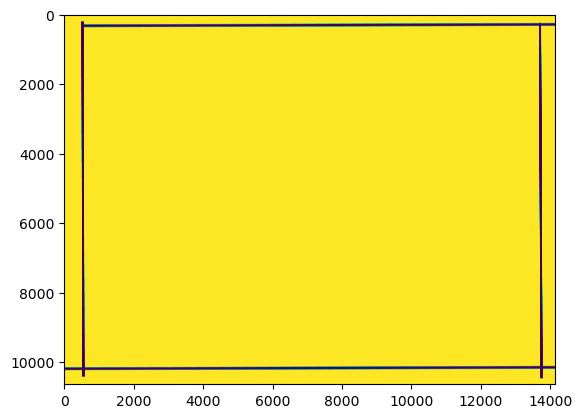

In [3]:
plt.imshow(edge_mask)
plt.show()

In [4]:
red_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_X_21000.bmp'
green_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Y_17500.bmp'
blue_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Z_28000.bmp'

clear_image_path = '/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_clear_21000.bmp'


red_image_255 = cv2.imread(red_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask
green_image_255 = cv2.imread(green_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask
blue_image_255 = cv2.imread(blue_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask
clear_image_255 = cv2.imread(blue_image_path, cv2.IMREAD_GRAYSCALE) * edge_mask

red_image_255 = mean_pooling(red_image_255, 7).astype(np.int16)
green_image_255 = mean_pooling(green_image_255, 7).astype(np.int16)
blue_image_255 = mean_pooling(blue_image_255, 7).astype(np.int16)
clear_image_255 = mean_pooling(clear_image_255, 7).astype(np.int16)

red_binary = np.where(red_image_255 > 8, 255, 0)
green_binary = np.where(green_image_255 > 8, 255, 0)
blue_binary = np.where(blue_image_255 > 8, 255, 0)


In [5]:
blue_binary.shape

(1520, 2021)

In [6]:
red_covered_pixels_mapping = run_dfs(red_binary,3)


copying array
creating boolean table
running
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266

In [7]:
green_covered_pixels_mapping = run_dfs(green_binary,5)


copying array
creating boolean table
running
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266

In [8]:
blue_covered_pixels_mapping = run_dfs(blue_binary,4)

copying array
creating boolean table
running
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266

In [9]:
red_new_df, green_new_df, blue_new_df, a = generate_RGB_dataframes(red_covered_pixels_mapping, green_covered_pixels_mapping, blue_covered_pixels_mapping, True, 7, mask=edge_mask)

<Axes: xlabel='index'>

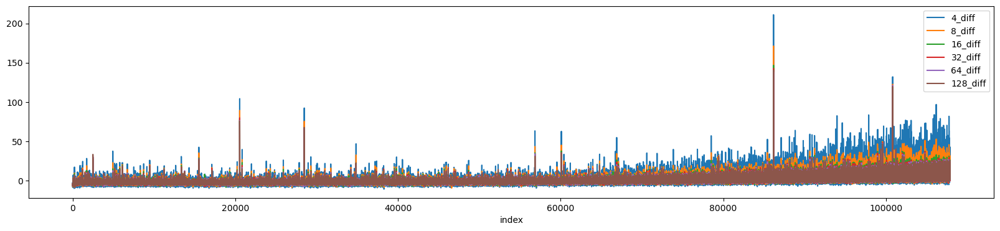

In [10]:
red_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff'])

<Axes: xlabel='index'>

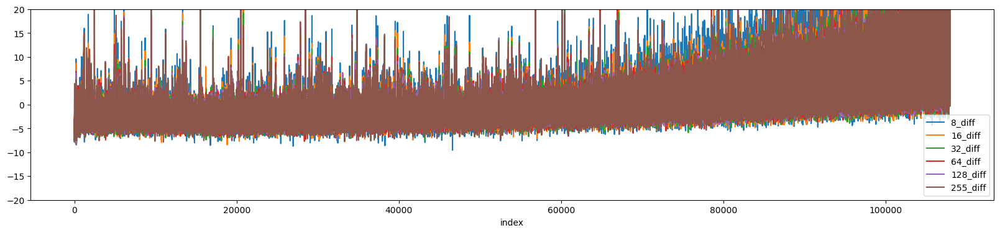

In [11]:
red_new_df.reset_index().plot(figsize=[20, 4], ylim = [-20, 20],x='index', y=[ '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

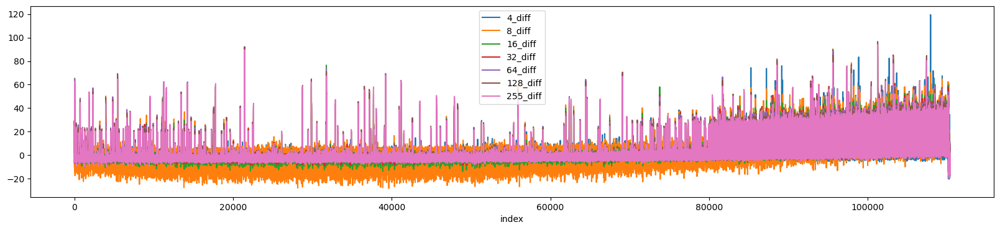

In [12]:
green_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

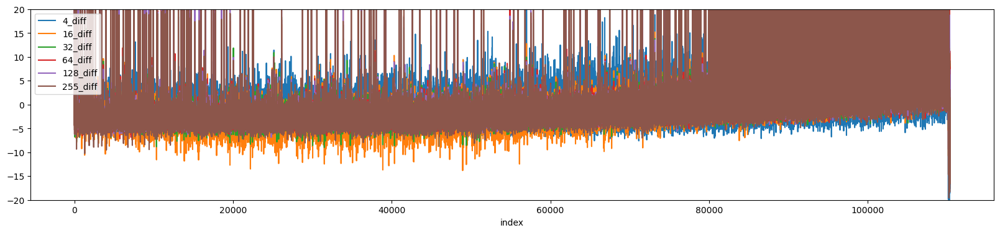

In [13]:
green_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

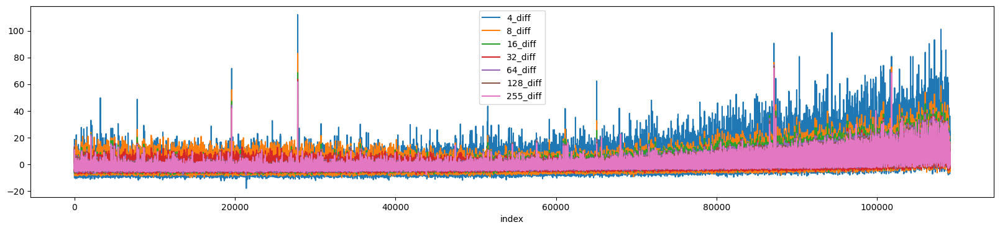

In [14]:
blue_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

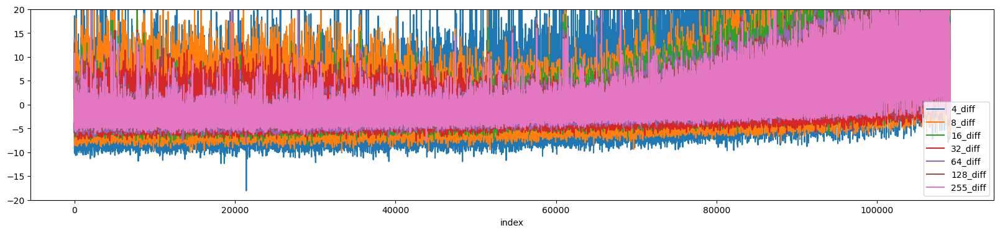

In [15]:
blue_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

In [16]:

red_binary = reconstruct_mask(red_binary, red_covered_pixels_mapping)

green_binary = reconstruct_mask(green_binary, green_covered_pixels_mapping)

blue_binary = reconstruct_mask(blue_binary, blue_covered_pixels_mapping)

In [17]:
red_binary.shape

(1520, 2021)

In [18]:
cv2.imwrite('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/output/red_image_255.png', red_image_255)

True

In [19]:
rgb_binary = np.array([red_binary, green_binary, blue_binary])
rgb_percentage = np.zeros(rgb_binary.shape)

In [20]:
def normalize(image_255, thres, max):
    norm = np.where(image_255 > thres, image_255, 0)
    norm = max * (norm / norm[norm > 0].mean())
    return norm


In [21]:
red_image_255_norm = normalize(red_image_255, 8, 200)
green_image_255_norm = normalize(green_image_255, 8, 200)
blue_image_255_norm = normalize(blue_image_255, 8, 200)

In [22]:

for row in range(0,len(rgb_binary[0])):
    for col in range(0, len(rgb_binary[0][0])):
        if (rgb_binary[0][row][col] != 0 and rgb_binary[1][row][col] != 0) or (rgb_binary[0][row][col] != 0 and rgb_binary[2][row][col] != 0) or (rgb_binary[1][row][col] != 0 and rgb_binary[2][row][col] != 0):
            sum = red_image_255_norm[row][col] + green_image_255_norm[row][col] + blue_image_255_norm[row][col]
            rgb_percentage[0][row][col] = red_image_255_norm[row][col] / sum
            rgb_percentage[1][row][col] = green_image_255_norm[row][col] / sum
            rgb_percentage[2][row][col] = blue_image_255_norm[row][col] / sum


In [23]:
rgb_percentage

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]])

In [24]:

def generate_RGB_dataframes(red_covered_pixels_mapping, green_covered_pixels_mapping, blue_covered_pixels_mapping, is_down_sample=False, kernal=5, overlap_percentage=None, mask=None):
    clear_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_clear_140000000.bmp', cv2.IMREAD_GRAYSCALE)

    if type(mask) == type(None):
        mask = np.ones_like(clear_image_4)

    clear_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_clear_140000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_clear_49000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_clear_11200000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_clear_2800000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_clear_489999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_clear_125999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    clear_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_clear_21000.bmp', cv2.IMREAD_GRAYSCALE) * mask

    red_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_X_140000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_X_49000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_X_11200000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_X_3500000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_X_595000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_X_125999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    red_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_X_21000.bmp', cv2.IMREAD_GRAYSCALE) * mask


    green_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_Y_140000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_Y_28000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_Y_8750000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_Y_2100000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_Y_455000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_Y_91000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    green_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Y_17500.bmp', cv2.IMREAD_GRAYSCALE) * mask


    blue_image_4 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/4_4_4_Z_210000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_8 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/8_8_8_Z_77000000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_16 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/16_16_16_Z_14699999.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_32 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/32_32_32_Z_4550000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_64 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/64_64_64_Z_770000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_128 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/128_128_128_Z_140000.bmp', cv2.IMREAD_GRAYSCALE) * mask
    blue_image_255 = cv2.imread('/Users/codyyu/Desktop/leakage_data_WHITE_TEST/reduced/255_255_255_Z_28000.bmp', cv2.IMREAD_GRAYSCALE) * mask

    overlap_set = []
    if is_down_sample:
        clear_image_4 = mean_pooling(clear_image_4, kernal).astype(np.int16)
        clear_image_8 = mean_pooling(clear_image_8, kernal).astype(np.int16)
        clear_image_16 = mean_pooling(clear_image_16, kernal).astype(np.int16)
        clear_image_32 = mean_pooling(clear_image_32, kernal).astype(np.int16)
        clear_image_64 = mean_pooling(clear_image_64, kernal).astype(np.int16)
        clear_image_128 = mean_pooling(clear_image_128, kernal).astype(np.int16)
        clear_image_255 = mean_pooling(clear_image_255, kernal).astype(np.int16)

        red_image_4 = mean_pooling(red_image_4, kernal).astype(np.int16)
        red_image_8 = mean_pooling(red_image_8, kernal).astype(np.int16)
        red_image_16 = mean_pooling(red_image_16, kernal).astype(np.int16)
        red_image_32 = mean_pooling(red_image_32, kernal).astype(np.int16)
        red_image_64 = mean_pooling(red_image_64, kernal).astype(np.int16)
        red_image_128 = mean_pooling(red_image_128, kernal).astype(np.int16)
        red_image_255 = mean_pooling(red_image_255, kernal).astype(np.int16)


        green_image_4 = mean_pooling(green_image_4, kernal).astype(np.int16)
        green_image_8 = mean_pooling(green_image_8, kernal).astype(np.int16)
        green_image_16 = mean_pooling(green_image_16, kernal).astype(np.int16)
        green_image_32 = mean_pooling(green_image_32, kernal).astype(np.int16)
        green_image_64 = mean_pooling(green_image_64, kernal).astype(np.int16)
        green_image_128 = mean_pooling(green_image_128, kernal).astype(np.int16)
        green_image_255 = mean_pooling(green_image_255, kernal).astype(np.int16)


        blue_image_4 = mean_pooling(blue_image_4, kernal).astype(np.int16)
        blue_image_8 = mean_pooling(blue_image_8, kernal).astype(np.int16)
        blue_image_16 = mean_pooling(blue_image_16, kernal).astype(np.int16)
        blue_image_32 = mean_pooling(blue_image_32, kernal).astype(np.int16)
        blue_image_64 = mean_pooling(blue_image_64, kernal).astype(np.int16)
        blue_image_128 = mean_pooling(blue_image_128, kernal).astype(np.int16)
        blue_image_255 = mean_pooling(blue_image_255, kernal).astype(np.int16)
    
    if overlap_percentage is not None:
        print('overlap_percentage loading....')
        red_signal_map_4, a = get_signal_mapping_overlap(clear_image_4, red_covered_pixels_mapping, overlap_percentage[0])
        overlap_set = overlap_set + (a)
        red_signal_map_8 = get_signal_mapping_overlap(clear_image_8, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_16 = get_signal_mapping_overlap(clear_image_16, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_32 = get_signal_mapping_overlap(clear_image_32, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_64 = get_signal_mapping_overlap(clear_image_64, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_128 = get_signal_mapping_overlap(clear_image_128, red_covered_pixels_mapping, overlap_percentage[0])[0]
        red_signal_map_255 = get_signal_mapping_overlap(clear_image_255, red_covered_pixels_mapping, overlap_percentage[0])[0]

        green_signal_map_4,a = get_signal_mapping_overlap(clear_image_4, green_covered_pixels_mapping, overlap_percentage[1])
        overlap_set = overlap_set + (a)
        green_signal_map_8 = get_signal_mapping_overlap(clear_image_8, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_16 = get_signal_mapping_overlap(clear_image_16, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_32 = get_signal_mapping_overlap(clear_image_32, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_64 = get_signal_mapping_overlap(clear_image_64, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_128 = get_signal_mapping_overlap(clear_image_128, green_covered_pixels_mapping, overlap_percentage[1])[0]
        green_signal_map_255 = get_signal_mapping_overlap(clear_image_255, green_covered_pixels_mapping, overlap_percentage[1])[0]

        blue_signal_map_4,a = get_signal_mapping_overlap(clear_image_4, blue_covered_pixels_mapping, overlap_percentage[2])
        overlap_set = overlap_set + (a)
        blue_signal_map_8 = get_signal_mapping_overlap(clear_image_8, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_16 = get_signal_mapping_overlap(clear_image_16, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_32 = get_signal_mapping_overlap(clear_image_32, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_64 = get_signal_mapping_overlap(clear_image_64, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_128 = get_signal_mapping_overlap(clear_image_128, blue_covered_pixels_mapping, overlap_percentage[2])[0]
        blue_signal_map_255 = get_signal_mapping_overlap(clear_image_255, blue_covered_pixels_mapping, overlap_percentage[2])[0]

    else:
        red_signal_map_4 = get_signal_mapping(clear_image_4, red_covered_pixels_mapping)
        red_signal_map_8 = get_signal_mapping(clear_image_8, red_covered_pixels_mapping)
        red_signal_map_16 = get_signal_mapping(clear_image_16, red_covered_pixels_mapping)
        red_signal_map_32 = get_signal_mapping(clear_image_32, red_covered_pixels_mapping)
        red_signal_map_64 = get_signal_mapping(clear_image_64, red_covered_pixels_mapping)
        red_signal_map_128 = get_signal_mapping(clear_image_128, red_covered_pixels_mapping)
        red_signal_map_255 = get_signal_mapping(clear_image_255, red_covered_pixels_mapping)

        green_signal_map_4 = get_signal_mapping(clear_image_4, green_covered_pixels_mapping)
        green_signal_map_8 = get_signal_mapping(clear_image_8, green_covered_pixels_mapping)
        green_signal_map_16 = get_signal_mapping(clear_image_16, green_covered_pixels_mapping)
        green_signal_map_32 = get_signal_mapping(clear_image_32, green_covered_pixels_mapping)
        green_signal_map_64 = get_signal_mapping(clear_image_64, green_covered_pixels_mapping)
        green_signal_map_128 = get_signal_mapping(clear_image_128, green_covered_pixels_mapping)
        green_signal_map_255 = get_signal_mapping(clear_image_255, green_covered_pixels_mapping)

        blue_signal_map_4 = get_signal_mapping(clear_image_4, blue_covered_pixels_mapping)
        blue_signal_map_8 = get_signal_mapping(clear_image_8, blue_covered_pixels_mapping)
        blue_signal_map_16 = get_signal_mapping(clear_image_16, blue_covered_pixels_mapping)
        blue_signal_map_32 = get_signal_mapping(clear_image_32, blue_covered_pixels_mapping)
        blue_signal_map_64 = get_signal_mapping(clear_image_64, blue_covered_pixels_mapping)
        blue_signal_map_128 = get_signal_mapping(clear_image_128, blue_covered_pixels_mapping)
        blue_signal_map_255 = get_signal_mapping(clear_image_255, blue_covered_pixels_mapping)

    red_signal_map_ground_truth_4 = get_signal_mapping(red_image_4, red_covered_pixels_mapping)
    red_signal_map_ground_truth_8 = get_signal_mapping(red_image_8, red_covered_pixels_mapping)
    red_signal_map_ground_truth_16 = get_signal_mapping(red_image_16, red_covered_pixels_mapping)
    red_signal_map_ground_truth_32 = get_signal_mapping(red_image_32, red_covered_pixels_mapping)
    red_signal_map_ground_truth_64 = get_signal_mapping(red_image_64, red_covered_pixels_mapping)
    red_signal_map_ground_truth_128 = get_signal_mapping(red_image_128, red_covered_pixels_mapping)
    red_signal_map_ground_truth_255 = get_signal_mapping(red_image_255, red_covered_pixels_mapping)

    green_signal_map_ground_truth_4 = get_signal_mapping(green_image_4, green_covered_pixels_mapping)
    green_signal_map_ground_truth_8 = get_signal_mapping(green_image_8, green_covered_pixels_mapping)
    green_signal_map_ground_truth_16 = get_signal_mapping(green_image_16, green_covered_pixels_mapping)
    green_signal_map_ground_truth_32 = get_signal_mapping(green_image_32, green_covered_pixels_mapping)
    green_signal_map_ground_truth_64 = get_signal_mapping(green_image_64, green_covered_pixels_mapping)
    green_signal_map_ground_truth_128 = get_signal_mapping(green_image_128, green_covered_pixels_mapping)
    green_signal_map_ground_truth_255 = get_signal_mapping(green_image_255, green_covered_pixels_mapping)

    blue_signal_map_ground_truth_4 = get_signal_mapping(blue_image_4, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_8 = get_signal_mapping(blue_image_8, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_16 = get_signal_mapping(blue_image_16, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_32 = get_signal_mapping(blue_image_32, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_64 = get_signal_mapping(blue_image_64, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_128 = get_signal_mapping(blue_image_128, blue_covered_pixels_mapping)
    blue_signal_map_ground_truth_255 = get_signal_mapping(blue_image_255, blue_covered_pixels_mapping)


    red_df = pd.DataFrame()
    green_df = pd.DataFrame()
    blue_df = pd.DataFrame()

    red_df["4_ground_truth_mapping"] = red_signal_map_ground_truth_4.values()
    red_df["8_ground_truth_mapping"] = red_signal_map_ground_truth_8.values()
    red_df["16_ground_truth_mapping"] = red_signal_map_ground_truth_16.values()
    red_df["32_ground_truth_mapping"] = red_signal_map_ground_truth_32.values()
    red_df["64_ground_truth_mapping"] = red_signal_map_ground_truth_64.values()
    red_df["128_ground_truth_mapping"] = red_signal_map_ground_truth_128.values()
    red_df["255_ground_truth_mapping"] = red_signal_map_ground_truth_255.values()

    red_df["4_mapping"] = red_signal_map_4.values()
    red_df["8_mapping"] = red_signal_map_8.values()
    red_df["16_mapping"] = red_signal_map_16.values()
    red_df["32_mapping"] = red_signal_map_32.values()
    red_df["64_mapping"] = red_signal_map_64.values()
    red_df["128_mapping"] = red_signal_map_128.values()
    red_df["255_mapping"] = red_signal_map_255.values()

    red_df["4_diff"] = red_df["4_ground_truth_mapping"] - red_df["4_mapping"]
    red_df["8_diff"] = red_df["8_ground_truth_mapping"] - red_df["8_mapping"]
    red_df["16_diff"] = red_df["16_ground_truth_mapping"] - red_df["16_mapping"]
    red_df["32_diff"] = red_df["32_ground_truth_mapping"] - red_df["32_mapping"]
    red_df["64_diff"] = red_df["64_ground_truth_mapping"] - red_df["64_mapping"]
    red_df["128_diff"] = red_df["128_ground_truth_mapping"] - red_df["128_mapping"]
    red_df["255_diff"] = red_df["255_ground_truth_mapping"] - red_df["255_mapping"]

    red_df["4_to_gt_ratio"] = red_df["4_mapping"] / red_df["4_ground_truth_mapping"]
    red_df["8_to_gt_ratio"] = red_df["8_mapping"] / red_df["8_ground_truth_mapping"] 
    red_df["16_to_gt_ratio"] = red_df["16_mapping"] / red_df["16_ground_truth_mapping"]
    red_df["32_to_gt_ratio"] = red_df["32_mapping"] / red_df["32_ground_truth_mapping"]
    red_df["64_to_gt_ratio"] = red_df["64_mapping"] / red_df["64_ground_truth_mapping"]
    red_df["128_to_gt_ratio"] = red_df["128_mapping"] / red_df["128_ground_truth_mapping"]
    red_df["255_to_gt_ratio"] = red_df["255_mapping"] / red_df["255_ground_truth_mapping"]

    red_df["4_diff_percentage"] = ((red_df['4_to_gt_ratio'].mean() - 1) * 100)
    red_df["8_diff_percentage"] = ((red_df['8_to_gt_ratio'].mean() - 1) * 100)
    red_df["16_diff_percentage"] = ((red_df['16_to_gt_ratio'].mean() - 1) * 100)
    red_df["32_diff_percentage"] = ((red_df['32_to_gt_ratio'].mean() - 1) * 100)
    red_df["64_diff_percentage"] = ((red_df['64_to_gt_ratio'].mean() - 1) * 100)
    red_df["128_diff_percentage"] = ((red_df['128_to_gt_ratio'].mean() - 1) * 100)
    red_df["255_diff_percentage"] = ((red_df['255_to_gt_ratio'].mean() - 1) * 100)

    red_df['4_normalized'] = red_df['4_to_gt_ratio'].mean() * red_df["4_ground_truth_mapping"]
    red_df['8_normalized'] = red_df['8_to_gt_ratio'].mean() * red_df["8_ground_truth_mapping"]
    red_df['16_normalized'] = red_df['16_to_gt_ratio'].mean() * red_df["16_ground_truth_mapping"]
    red_df['32_normalized'] = red_df['32_to_gt_ratio'].mean() * red_df["32_ground_truth_mapping"]
    red_df['64_normalized'] = red_df['64_to_gt_ratio'].mean() * red_df["64_ground_truth_mapping"]
    red_df['128_normalized'] = red_df['128_to_gt_ratio'].mean() * red_df["128_ground_truth_mapping"]
    red_df['255_normalized'] = red_df['255_to_gt_ratio'].mean() * red_df["255_ground_truth_mapping"]




    green_df["4_ground_truth_mapping"] = green_signal_map_ground_truth_4.values()
    green_df["8_ground_truth_mapping"] = green_signal_map_ground_truth_8.values()
    green_df["16_ground_truth_mapping"] = green_signal_map_ground_truth_16.values()
    green_df["32_ground_truth_mapping"] = green_signal_map_ground_truth_32.values()
    green_df["64_ground_truth_mapping"] = green_signal_map_ground_truth_64.values()
    green_df["128_ground_truth_mapping"] = green_signal_map_ground_truth_128.values()
    green_df["255_ground_truth_mapping"] = green_signal_map_ground_truth_255.values()

    green_df["4_mapping"] = green_signal_map_4.values()
    green_df["8_mapping"] = green_signal_map_8.values()
    green_df["16_mapping"] = green_signal_map_16.values()
    green_df["32_mapping"] = green_signal_map_32.values()
    green_df["64_mapping"] = green_signal_map_64.values()
    green_df["128_mapping"] = green_signal_map_128.values()
    green_df["255_mapping"] = green_signal_map_255.values()

    green_df["4_diff"] = green_df["4_ground_truth_mapping"] - green_df["4_mapping"]
    green_df["8_diff"] = green_df["8_ground_truth_mapping"] - green_df["8_mapping"]
    green_df["16_diff"] = green_df["16_ground_truth_mapping"] - green_df["16_mapping"]
    green_df["32_diff"] = green_df["32_ground_truth_mapping"] - green_df["32_mapping"]
    green_df["64_diff"] = green_df["64_ground_truth_mapping"] - green_df["64_mapping"]
    green_df["128_diff"] = green_df["128_ground_truth_mapping"] - green_df["128_mapping"]
    green_df["255_diff"] = green_df["255_ground_truth_mapping"] - green_df["255_mapping"]

    green_df["4_to_gt_ratio"] = green_df["4_mapping"] / green_df["4_ground_truth_mapping"]
    green_df["8_to_gt_ratio"] = green_df["8_mapping"] / green_df["8_ground_truth_mapping"] 
    green_df["16_to_gt_ratio"] = green_df["16_mapping"] / green_df["16_ground_truth_mapping"]
    green_df["32_to_gt_ratio"] = green_df["32_mapping"] / green_df["32_ground_truth_mapping"]
    green_df["64_to_gt_ratio"] = green_df["64_mapping"] / green_df["64_ground_truth_mapping"]
    green_df["128_to_gt_ratio"] = green_df["128_mapping"] / green_df["128_ground_truth_mapping"]
    green_df["255_to_gt_ratio"] = green_df["255_mapping"] / green_df["255_ground_truth_mapping"]

    green_df["4_diff_percentage"] = ((green_df['4_to_gt_ratio'].mean() - 1) * 100)
    green_df["8_diff_percentage"] = ((green_df['8_to_gt_ratio'].mean() - 1) * 100)
    green_df["16_diff_percentage"] = ((green_df['16_to_gt_ratio'].mean() - 1) * 100)
    green_df["32_diff_percentage"] = ((green_df['32_to_gt_ratio'].mean() - 1) * 100)
    green_df["64_diff_percentage"] = ((green_df['64_to_gt_ratio'].mean() - 1) * 100)
    green_df["128_diff_percentage"] = ((green_df['128_to_gt_ratio'].mean() - 1) * 100)
    green_df["255_diff_percentage"] = ((green_df['255_to_gt_ratio'].mean() - 1) * 100)

    green_df['4_normalized'] = green_df['4_to_gt_ratio'].mean() * green_df["4_ground_truth_mapping"]
    green_df['8_normalized'] = green_df['8_to_gt_ratio'].mean() * green_df["8_ground_truth_mapping"]
    green_df['16_normalized'] = green_df['16_to_gt_ratio'].mean() * green_df["16_ground_truth_mapping"]
    green_df['32_normalized'] = green_df['32_to_gt_ratio'].mean() * green_df["32_ground_truth_mapping"]
    green_df['64_normalized'] = green_df['64_to_gt_ratio'].mean() * green_df["64_ground_truth_mapping"]
    green_df['128_normalized'] = green_df['128_to_gt_ratio'].mean() * green_df["128_ground_truth_mapping"]
    green_df['255_normalized'] = green_df['255_to_gt_ratio'].mean() * green_df["255_ground_truth_mapping"]



    blue_df["4_ground_truth_mapping"] = blue_signal_map_ground_truth_4.values()
    blue_df["8_ground_truth_mapping"] = blue_signal_map_ground_truth_8.values()
    blue_df["16_ground_truth_mapping"] = blue_signal_map_ground_truth_16.values()
    blue_df["32_ground_truth_mapping"] = blue_signal_map_ground_truth_32.values()
    blue_df["64_ground_truth_mapping"] = blue_signal_map_ground_truth_64.values()
    blue_df["128_ground_truth_mapping"] = blue_signal_map_ground_truth_128.values()
    blue_df["255_ground_truth_mapping"] = blue_signal_map_ground_truth_255.values()

    blue_df["4_mapping"] = blue_signal_map_4.values()
    blue_df["8_mapping"] = blue_signal_map_8.values()
    blue_df["16_mapping"] = blue_signal_map_16.values()
    blue_df["32_mapping"] = blue_signal_map_32.values()
    blue_df["64_mapping"] = blue_signal_map_64.values()
    blue_df["128_mapping"] = blue_signal_map_128.values()
    blue_df["255_mapping"] = blue_signal_map_255.values()

    blue_df["4_diff"] = blue_df["4_ground_truth_mapping"] - blue_df["4_mapping"]
    blue_df["8_diff"] = blue_df["8_ground_truth_mapping"] - blue_df["8_mapping"]
    blue_df["16_diff"] = blue_df["16_ground_truth_mapping"] - blue_df["16_mapping"]
    blue_df["32_diff"] = blue_df["32_ground_truth_mapping"] - blue_df["32_mapping"]
    blue_df["64_diff"] = blue_df["64_ground_truth_mapping"] - blue_df["64_mapping"]
    blue_df["128_diff"] = blue_df["128_ground_truth_mapping"] - blue_df["128_mapping"]
    blue_df["255_diff"] = blue_df["255_ground_truth_mapping"] - blue_df["255_mapping"]

    blue_df["4_to_gt_ratio"] = blue_df["4_mapping"] / blue_df["4_ground_truth_mapping"]
    blue_df["8_to_gt_ratio"] = blue_df["8_mapping"] / blue_df["8_ground_truth_mapping"] 
    blue_df["16_to_gt_ratio"] = blue_df["16_mapping"] / blue_df["16_ground_truth_mapping"]
    blue_df["32_to_gt_ratio"] = blue_df["32_mapping"] / blue_df["32_ground_truth_mapping"]
    blue_df["64_to_gt_ratio"] = blue_df["64_mapping"] / blue_df["64_ground_truth_mapping"]
    blue_df["128_to_gt_ratio"] = blue_df["128_mapping"] / blue_df["128_ground_truth_mapping"]
    blue_df["255_to_gt_ratio"] = blue_df["255_mapping"] / blue_df["255_ground_truth_mapping"]

    blue_df["4_diff_percentage"] = ((blue_df['4_to_gt_ratio'].mean() - 1) * 100)
    blue_df["8_diff_percentage"] = ((blue_df['8_to_gt_ratio'].mean() - 1) * 100)
    blue_df["16_diff_percentage"] = ((blue_df['16_to_gt_ratio'].mean() - 1) * 100)
    blue_df["32_diff_percentage"] = ((blue_df['32_to_gt_ratio'].mean() - 1) * 100)
    blue_df["64_diff_percentage"] = ((blue_df['64_to_gt_ratio'].mean() - 1) * 100)
    blue_df["128_diff_percentage"] = ((blue_df['128_to_gt_ratio'].mean() - 1) * 100)
    blue_df["255_diff_percentage"] = ((blue_df['255_to_gt_ratio'].mean() - 1) * 100)

    blue_df['4_normalized'] = blue_df['4_to_gt_ratio'].mean() * blue_df["4_ground_truth_mapping"]
    blue_df['8_normalized'] = blue_df['8_to_gt_ratio'].mean() * blue_df["8_ground_truth_mapping"]
    blue_df['16_normalized'] = blue_df['16_to_gt_ratio'].mean() * blue_df["16_ground_truth_mapping"]
    blue_df['32_normalized'] = blue_df['32_to_gt_ratio'].mean() * blue_df["32_ground_truth_mapping"]
    blue_df['64_normalized'] = blue_df['64_to_gt_ratio'].mean() * blue_df["64_ground_truth_mapping"]
    blue_df['128_normalized'] = blue_df['128_to_gt_ratio'].mean() * blue_df["128_ground_truth_mapping"]
    blue_df['255_normalized'] = blue_df['255_to_gt_ratio'].mean() * blue_df["255_ground_truth_mapping"]


    red_new_df = pd.DataFrame()

    red_new_df['4_diff'] = 100 * ((red_df['4_mapping'] / red_df['4_mapping'].mean()) - (red_df['4_ground_truth_mapping'] / red_df['4_ground_truth_mapping'].mean()))/((red_df['4_ground_truth_mapping'] / red_df['4_ground_truth_mapping'].mean()))
    red_new_df['8_diff'] = 100 * ((red_df['8_mapping'] / red_df['8_mapping'].mean()) - (red_df['8_ground_truth_mapping'] / red_df['8_ground_truth_mapping'].mean()))/((red_df['8_ground_truth_mapping'] / red_df['8_ground_truth_mapping'].mean()))
    red_new_df['16_diff'] = 100 * ((red_df['16_mapping'] / red_df['16_mapping'].mean()) - (red_df['16_ground_truth_mapping'] / red_df['16_ground_truth_mapping'].mean()))/((red_df['16_ground_truth_mapping'] / red_df['16_ground_truth_mapping'].mean()))
    red_new_df['32_diff'] = 100 * ((red_df['32_mapping'] / red_df['32_mapping'].mean()) - (red_df['32_ground_truth_mapping'] / red_df['32_ground_truth_mapping'].mean()))/((red_df['32_ground_truth_mapping'] / red_df['32_ground_truth_mapping'].mean()))
    red_new_df['64_diff'] = 100 * ((red_df['64_mapping'] / red_df['64_mapping'].mean()) - (red_df['64_ground_truth_mapping'] / red_df['64_ground_truth_mapping'].mean()))/((red_df['64_ground_truth_mapping'] / red_df['64_ground_truth_mapping'].mean()))
    red_new_df['128_diff'] = 100 * ((red_df['128_mapping'] / red_df['128_mapping'].mean()) - (red_df['128_ground_truth_mapping'] / red_df['128_ground_truth_mapping'].mean()))/((red_df['128_ground_truth_mapping'] / red_df['128_ground_truth_mapping'].mean()))
    red_new_df['255_diff'] = 100 * ((red_df['255_mapping'] / red_df['255_mapping'].mean()) - (red_df['255_ground_truth_mapping'] / red_df['255_ground_truth_mapping'].mean()))/((red_df['255_ground_truth_mapping'] / red_df['255_ground_truth_mapping'].mean()))

    red_new_df['A-1_4'] = 100 * ((red_df['4_mapping'] / red_df['4_mapping'].mean()) - 1)
    red_new_df['A-1_8'] = 100 * ((red_df['8_mapping'] / red_df['8_mapping'].mean()) - 1)
    red_new_df['A-1_16'] = 100 * ((red_df['16_mapping'] / red_df['16_mapping'].mean()) - 1)
    red_new_df['A-1_32'] = 100 * ((red_df['32_mapping'] / red_df['32_mapping'].mean()) - 1)
    red_new_df['A-1_64'] = 100 * ((red_df['64_mapping'] / red_df['64_mapping'].mean()) - 1)
    red_new_df['A-1_128'] = 100 * ((red_df['128_mapping'] / red_df['128_mapping'].mean()) - 1)
    red_new_df['A-1_255'] = 100 * ((red_df['255_mapping'] / red_df['255_mapping'].mean()) - 1)

    red_new_df['B-1_4'] = 100 * ((red_df['4_ground_truth_mapping'] / red_df['4_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_8'] = 100 * ((red_df['8_ground_truth_mapping'] / red_df['8_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_16'] = 100 * ((red_df['16_ground_truth_mapping'] / red_df['16_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_32'] = 100 * ((red_df['32_ground_truth_mapping'] / red_df['32_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_64'] = 100 * ((red_df['64_ground_truth_mapping'] / red_df['64_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_128'] = 100 * ((red_df['128_ground_truth_mapping'] / red_df['128_ground_truth_mapping'].mean()) - 1)
    red_new_df['B-1_255'] = 100 * ((red_df['255_ground_truth_mapping'] / red_df['255_ground_truth_mapping'].mean()) - 1)


    green_new_df = pd.DataFrame()

    green_new_df['4_diff'] = 100 * ((green_df['4_mapping'] / green_df['4_mapping'].mean()) - (green_df['4_ground_truth_mapping'] / green_df['4_ground_truth_mapping'].mean()))/((green_df['4_ground_truth_mapping'] / green_df['4_ground_truth_mapping'].mean()))
    green_new_df['8_diff'] = 100 * ((green_df['8_mapping'] / green_df['8_mapping'].mean()) - (green_df['8_ground_truth_mapping'] / green_df['8_ground_truth_mapping'].mean()))/((green_df['8_ground_truth_mapping'] / green_df['8_ground_truth_mapping'].mean()))
    green_new_df['16_diff'] = 100 * ((green_df['16_mapping'] / green_df['16_mapping'].mean()) - (green_df['16_ground_truth_mapping'] / green_df['16_ground_truth_mapping'].mean()))/((green_df['16_ground_truth_mapping'] / green_df['16_ground_truth_mapping'].mean()))
    green_new_df['32_diff'] = 100 * ((green_df['32_mapping'] / green_df['32_mapping'].mean()) - (green_df['32_ground_truth_mapping'] / green_df['32_ground_truth_mapping'].mean()))/((green_df['32_ground_truth_mapping'] / green_df['32_ground_truth_mapping'].mean()))
    green_new_df['64_diff'] = 100 * ((green_df['64_mapping'] / green_df['64_mapping'].mean()) - (green_df['64_ground_truth_mapping'] / green_df['64_ground_truth_mapping'].mean()))/((green_df['64_ground_truth_mapping'] / green_df['64_ground_truth_mapping'].mean()))
    green_new_df['128_diff'] = 100 * ((green_df['128_mapping'] / green_df['128_mapping'].mean()) - (green_df['128_ground_truth_mapping'] / green_df['128_ground_truth_mapping'].mean()))/((green_df['128_ground_truth_mapping'] / green_df['128_ground_truth_mapping'].mean()))
    green_new_df['255_diff'] = 100 * ((green_df['255_mapping'] / green_df['255_mapping'].mean()) - (green_df['255_ground_truth_mapping'] / green_df['255_ground_truth_mapping'].mean()))/((green_df['255_ground_truth_mapping'] / green_df['255_ground_truth_mapping'].mean()))

    green_new_df['A-1_4'] = 100 * ((green_df['4_mapping'] / green_df['4_mapping'].mean()) - 1)
    green_new_df['A-1_8'] = 100 * ((green_df['8_mapping'] / green_df['8_mapping'].mean()) - 1)
    green_new_df['A-1_16'] = 100 * ((green_df['16_mapping'] / green_df['16_mapping'].mean()) - 1)
    green_new_df['A-1_32'] = 100 * ((green_df['32_mapping'] / green_df['32_mapping'].mean()) - 1)
    green_new_df['A-1_64'] = 100 * ((green_df['64_mapping'] / green_df['64_mapping'].mean()) - 1)
    green_new_df['A-1_128'] = 100 * ((green_df['128_mapping'] / green_df['128_mapping'].mean()) - 1)
    green_new_df['A-1_255'] = 100 * ((green_df['255_mapping'] / green_df['255_mapping'].mean()) - 1)

    green_new_df['B-1_4'] = 100 * ((green_df['4_ground_truth_mapping'] / green_df['4_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_8'] = 100 * ((green_df['8_ground_truth_mapping'] / green_df['8_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_16'] = 100 * ((green_df['16_ground_truth_mapping'] / green_df['16_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_32'] = 100 * ((green_df['32_ground_truth_mapping'] / green_df['32_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_64'] = 100 * ((green_df['64_ground_truth_mapping'] / green_df['64_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_128'] = 100 * ((green_df['128_ground_truth_mapping'] / green_df['128_ground_truth_mapping'].mean()) - 1)
    green_new_df['B-1_255'] = 100 * ((green_df['255_ground_truth_mapping'] / green_df['255_ground_truth_mapping'].mean()) - 1)


    blue_new_df = pd.DataFrame()

    blue_new_df['4_diff'] = 100 * ((blue_df['4_mapping'] / blue_df['4_mapping'].mean()) - (blue_df['4_ground_truth_mapping'] / blue_df['4_ground_truth_mapping'].mean()))/((blue_df['4_ground_truth_mapping'] / blue_df['4_ground_truth_mapping'].mean()))
    blue_new_df['8_diff'] = 100 * ((blue_df['8_mapping'] / blue_df['8_mapping'].mean()) - (blue_df['8_ground_truth_mapping'] / blue_df['8_ground_truth_mapping'].mean()))/((blue_df['8_ground_truth_mapping'] / blue_df['8_ground_truth_mapping'].mean()))
    blue_new_df['16_diff'] = 100 * ((blue_df['16_mapping'] / blue_df['16_mapping'].mean()) - (blue_df['16_ground_truth_mapping'] / blue_df['16_ground_truth_mapping'].mean()))/((blue_df['16_ground_truth_mapping'] / blue_df['16_ground_truth_mapping'].mean()))
    blue_new_df['32_diff'] = 100 * ((blue_df['32_mapping'] / blue_df['32_mapping'].mean()) - (blue_df['32_ground_truth_mapping'] / blue_df['32_ground_truth_mapping'].mean()))/((blue_df['32_ground_truth_mapping'] / blue_df['32_ground_truth_mapping'].mean()))
    blue_new_df['64_diff'] = 100 * ((blue_df['64_mapping'] / blue_df['64_mapping'].mean()) - (blue_df['64_ground_truth_mapping'] / blue_df['64_ground_truth_mapping'].mean()))/((blue_df['64_ground_truth_mapping'] / blue_df['64_ground_truth_mapping'].mean()))
    blue_new_df['128_diff'] = 100 * ((blue_df['128_mapping'] / blue_df['128_mapping'].mean()) - (blue_df['128_ground_truth_mapping'] / blue_df['128_ground_truth_mapping'].mean()))/((blue_df['128_ground_truth_mapping'] / blue_df['128_ground_truth_mapping'].mean()))
    blue_new_df['255_diff'] = 100 * ((blue_df['255_mapping'] / blue_df['255_mapping'].mean()) - (blue_df['255_ground_truth_mapping'] / blue_df['255_ground_truth_mapping'].mean()))/((blue_df['255_ground_truth_mapping'] / blue_df['255_ground_truth_mapping'].mean()))

    blue_new_df['A-1_4'] = 100 * ((blue_df['4_mapping'] / blue_df['4_mapping'].mean()) - 1)
    blue_new_df['A-1_8'] = 100 * ((blue_df['8_mapping'] / blue_df['8_mapping'].mean()) - 1)
    blue_new_df['A-1_16'] = 100 * ((blue_df['16_mapping'] / blue_df['16_mapping'].mean()) - 1)
    blue_new_df['A-1_32'] = 100 * ((blue_df['32_mapping'] / blue_df['32_mapping'].mean()) - 1)
    blue_new_df['A-1_64'] = 100 * ((blue_df['64_mapping'] / blue_df['64_mapping'].mean()) - 1)
    blue_new_df['A-1_128'] = 100 * ((blue_df['128_mapping'] / blue_df['128_mapping'].mean()) - 1)
    blue_new_df['A-1_255'] = 100 * ((blue_df['255_mapping'] / blue_df['255_mapping'].mean()) - 1)

    blue_new_df['B-1_4'] = 100 * ((blue_df['4_ground_truth_mapping'] / blue_df['4_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_8'] = 100 * ((blue_df['8_ground_truth_mapping'] / blue_df['8_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_16'] = 100 * ((blue_df['16_ground_truth_mapping'] / blue_df['16_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_32'] = 100 * ((blue_df['32_ground_truth_mapping'] / blue_df['32_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_64'] = 100 * ((blue_df['64_ground_truth_mapping'] / blue_df['64_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_128'] = 100 * ((blue_df['128_ground_truth_mapping'] / blue_df['128_ground_truth_mapping'].mean()) - 1)
    blue_new_df['B-1_255'] = 100 * ((blue_df['255_ground_truth_mapping'] / blue_df['255_ground_truth_mapping'].mean()) - 1)

    return red_new_df, green_new_df, blue_new_df, overlap_set




In [25]:
red_ol_new_df, green_ol_new_df, blue_ol_new_df, idxx  = generate_RGB_dataframes(red_covered_pixels_mapping, green_covered_pixels_mapping, blue_covered_pixels_mapping, True, 7, mask=edge_mask, overlap_percentage=rgb_percentage)

overlap_percentage loading....


<Axes: xlabel='index'>

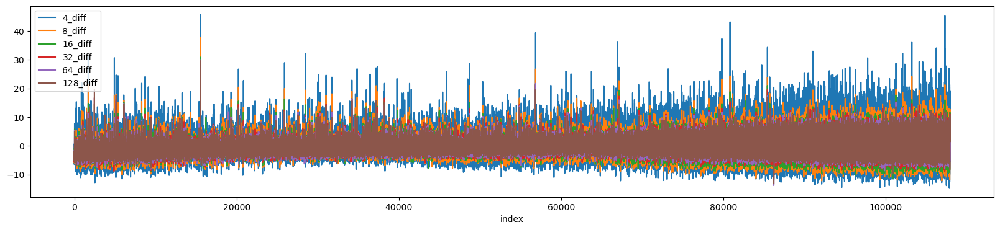

In [26]:
red_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff'])

<Axes: xlabel='index'>

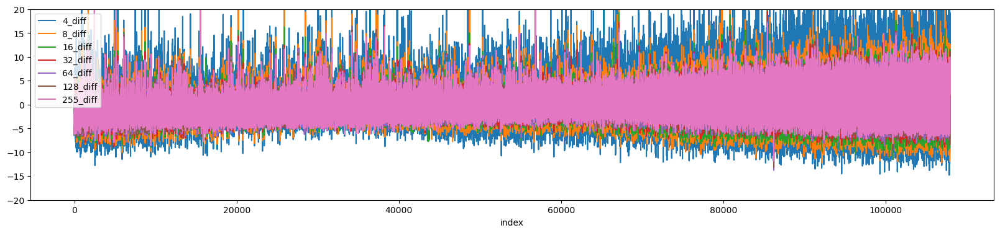

In [27]:
red_ol_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

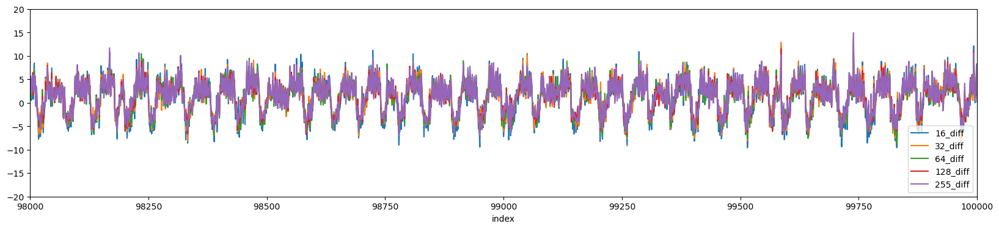

In [59]:
red_ol_new_df.reset_index().plot(figsize=[20, 4],xlim=[98000,100000], ylim=[-20, 20], x='index', y=['16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

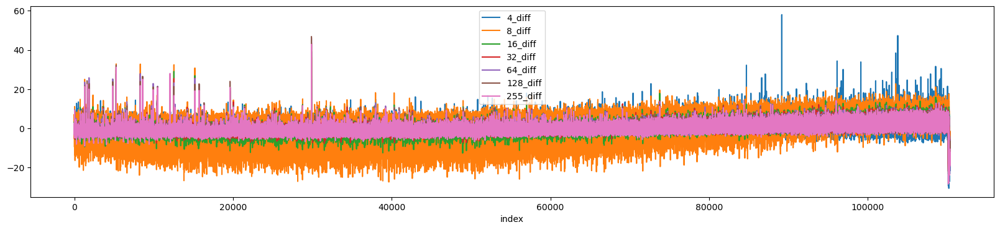

In [28]:
green_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

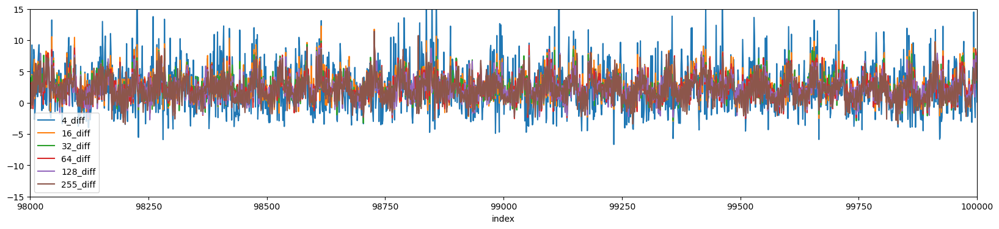

In [62]:
green_ol_new_df.reset_index().plot(figsize=[20, 4],ylim = [-15, 15], xlim = [98000, 100000], x='index', y=['4_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

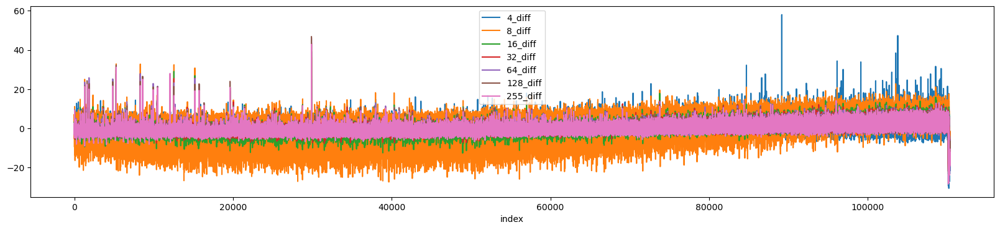

In [29]:
green_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

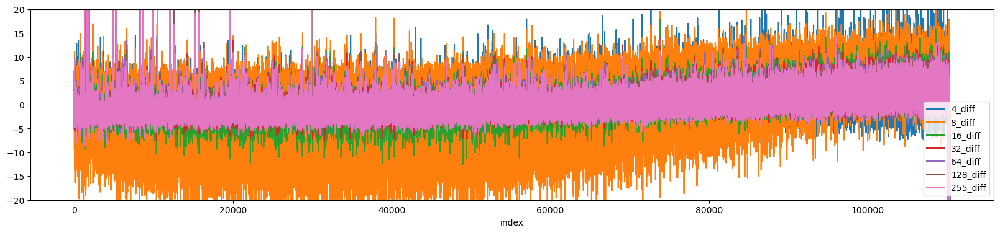

In [30]:
green_ol_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

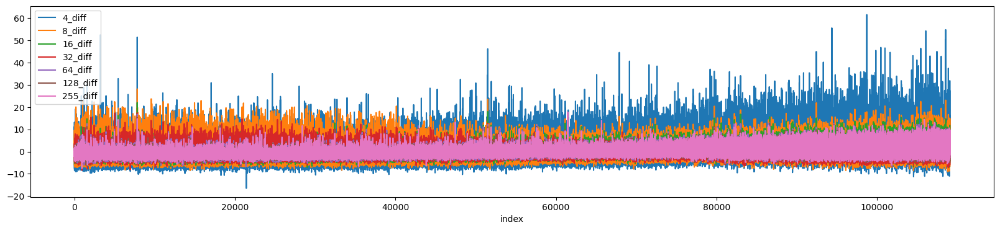

In [31]:
blue_ol_new_df.reset_index().plot(figsize=[20, 4], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

In [ ]:
blue_ol_new_df.reset_index().plot(figsize=[20, 4],ylim = [-15, 15], xlim = [98000, 100000], x='index', y=[ '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

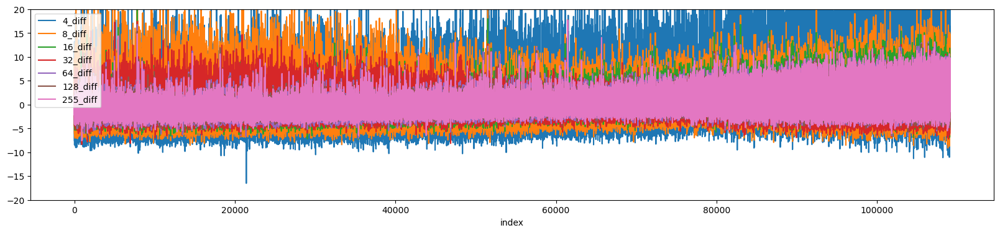

In [32]:
blue_ol_new_df.reset_index().plot(figsize=[20, 4], ylim=[-20, 20], x='index', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

<Axes: xlabel='index'>

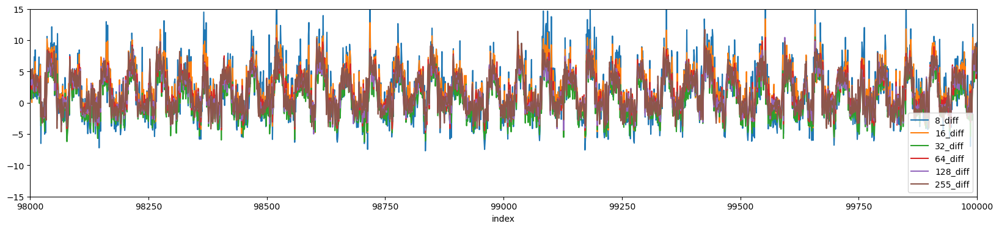

In [63]:
blue_ol_new_df.reset_index().plot(figsize=[20, 4],ylim = [-15, 15], xlim = [98000, 100000], x='index', y=[ '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'])

In [35]:
len(idxx)

61414

In [36]:
max_id = min(len(red_new_df), len(green_new_df), len(blue_new_df))

idxx = list(filter(lambda x: x < max_id, idxx))

In [37]:
red_new_df.iloc[idxx].reset_index().reset_index()

,level_0,index,4_diff,8_diff,16_diff,32_diff,64_diff,128_diff,255_diff,A-1_4,...,A-1_64,A-1_128,A-1_255,B-1_4,B-1_8,B-1_16,B-1_32,B-1_64,B-1_128,B-1_255
0,0,64,7.131321,0.698172,0.145519,-1.393210,-0.930318,-1.282517,-1.375886,-30.872066,...,-11.245300,-7.841736,-4.386637,-35.473647,-26.574362,-20.823681,-15.226640,-10.411844,-6.644435,-3.052753
1,1,204,-5.341296,-3.038140,-1.965739,-2.837065,-3.046461,-1.729203,-2.166617,2.526823,...,-5.044098,-5.478704,-6.137798,8.312092,4.893769,1.629305,1.372339,-2.060406,-3.815479,-4.059126
2,2,205,-2.101859,-0.633721,-1.848439,-1.883674,-1.392518,-2.391703,-2.698051,-21.939805,...,-12.408025,-7.841736,-4.036405,-20.263864,-19.192949,-15.702825,-13.151768,-11.171066,-5.583576,-1.375465
3,3,206,-4.001617,-3.250776,-3.764545,-2.984729,-3.086652,-3.491724,-2.922335,-11.065748,...,-5.819248,-6.491432,-7.188494,-7.358593,-5.595608,-1.128079,-2.480996,-2.819628,-3.108239,-4.394584
4,4,207,1.383062,0.092640,0.130308,-1.517760,-1.208806,-1.040124,-1.591910,-12.619185,...,-7.369548,-4.465976,-2.285245,-13.811229,-11.423040,-9.794144,-7.223561,-6.236125,-3.461859,-0.704550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58434,58434,107895,24.064671,16.727906,12.467181,11.784542,10.640077,10.071286,9.165389,-6.793797,...,5.420430,9.374643,12.424503,-24.872889,-18.027462,-12.945440,-8.409202,-4.717682,-0.632902,2.985483
58435,58435,107896,13.110682,9.913050,7.658710,8.618660,7.407109,8.191468,6.832288,-4.075283,...,1.932254,3.298274,7.871486,-15.193936,-11.423040,-5.855024,-6.037920,-5.097293,-4.522718,0.972738
58436,58436,107898,-0.177770,1.448956,0.829270,-0.345707,0.963590,2.306290,2.933799,2.138464,...,3.482555,0.935241,-1.935013,2.320360,2.562796,3.598865,4.040032,2.494924,-1.340142,-4.730041
58437,58437,107900,25.129498,16.583517,12.302468,11.077045,9.013017,8.307181,10.066887,-3.686923,...,3.870130,5.323730,8.922182,-23.029279,-17.638967,-10.975880,-8.409202,-4.717682,-2.754620,-1.040008


<Axes: xlabel='level_0'>

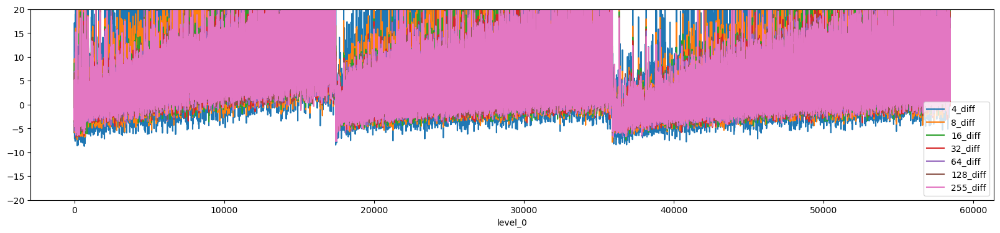

In [38]:
red_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],ylim = [-20, 20],x='level_0', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

In [64]:
len(idxx)

58439

In [66]:
len(idxx) /len(red_ol_new_df)

0.5415882783611207

<Axes: xlabel='level_0'>

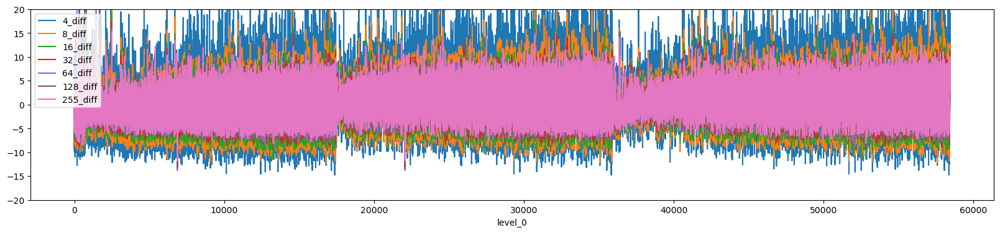

In [39]:
red_ol_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],ylim = [-20, 20],x='level_0', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

In [40]:
green_new_df

,4_diff,8_diff,16_diff,32_diff,64_diff,128_diff,255_diff,A-1_4,A-1_8,A-1_16,...,A-1_64,A-1_128,A-1_255,B-1_4,B-1_8,B-1_16,B-1_32,B-1_64,B-1_128,B-1_255
0,2.761199,5.475711,0.014202,0.226302,-0.063033,-1.892386,0.644278,-10.509138,-12.627324,-12.064489,...,-5.447598,-4.030109,0.057594,-12.913762,-17.163227,-12.076975,-8.644945,-5.387961,-2.178958,-0.582928
1,2.045103,0.686273,-0.661412,-0.200458,0.601567,-1.182613,-0.719466,23.192739,12.217986,3.995590,...,-0.319332,-2.088522,-1.298200,20.723813,11.453113,4.688008,0.894137,-0.915392,-0.916751,-0.582928
2,-0.207297,0.582428,-1.492091,-2.574806,-1.267296,-2.123747,-2.432145,36.330759,21.949066,8.997909,...,2.244801,0.685174,-0.213565,36.613956,21.242914,10.648891,6.030565,3.557178,2.869870,2.273884
3,-0.939273,-3.691769,-2.310891,-2.601767,-4.370564,-3.422100,-1.389088,38.806039,24.019509,11.367429,...,-0.639848,-4.307479,-5.907900,40.122169,28.773529,14.001888,7.131229,3.901221,-0.916751,-4.582466
4,1.090795,0.234061,0.859467,0.706579,0.578903,-0.980250,1.351575,48.326343,32.094235,18.739268,...,8.655134,3.736240,2.498023,46.725865,31.785776,17.727440,11.900770,8.029747,4.763181,1.131159
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110358,-16.629775,-7.896210,-11.779575,-9.775651,-8.072349,-9.387155,-13.427758,-37.546803,-44.512140,-49.713525,...,-52.243024,-53.679272,-54.987641,-25.089326,-39.755074,-42.999056,-46.801273,-48.049389,-48.880617,-48.006014
110359,-15.913211,-7.539810,-12.328283,-9.608400,-8.893456,-12.100115,-16.538892,-51.065635,-53.000954,-56.558804,...,-57.371290,-58.394556,-58.512705,-41.804931,-49.168344,-50.450160,-52.671478,-53.210046,-52.667238,-50.291464
110360,-10.546563,-4.790443,-8.244649,-8.274657,-5.516980,-9.353243,-13.852910,-69.725432,-61.282724,-57.611924,...,-54.166124,-54.234012,-54.716482,-66.156059,-59.334675,-53.803156,-51.937702,-51.489827,-49.511720,-47.434652
110361,-3.019218,3.053192,2.538923,5.489288,5.163991,6.171210,1.398661,-45.163046,-44.512140,-41.551846,...,-41.024942,-40.365530,-40.616225,-43.455855,-46.156097,-42.999056,-43.866171,-43.920864,-43.831789,-41.435346


In [41]:
idxx = list(filter(lambda x: x < 113952, idxx))

In [42]:
len(idxx)

58439

<Axes: xlabel='level_0'>

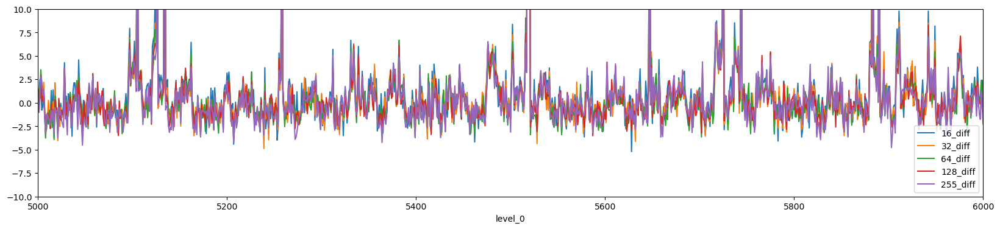

In [43]:
green_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],xlim=[5000,6000],ylim = [-10, 10],x='level_0', y=['16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

<Axes: xlabel='level_0'>

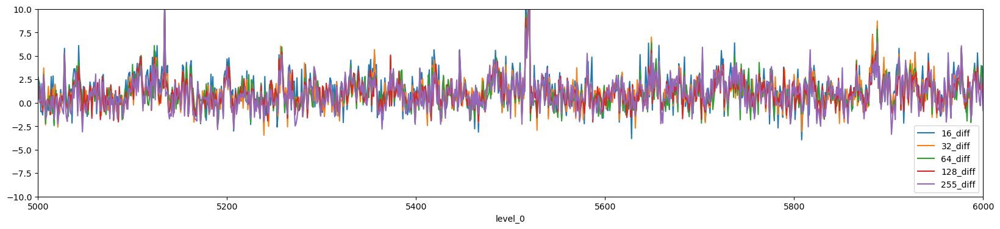

In [44]:
green_ol_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],xlim=[5000,6000],ylim = [-10, 10],x='level_0', y=[ '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

<Axes: xlabel='level_0'>

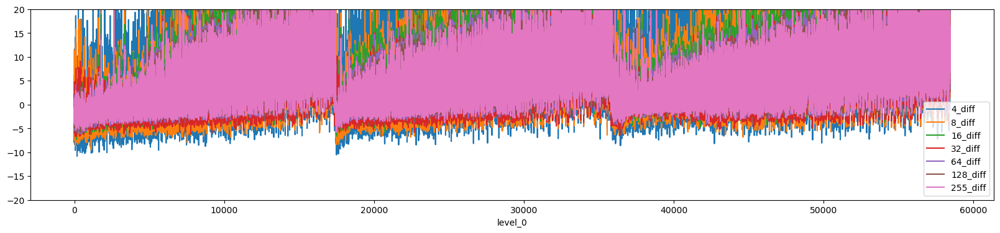

In [45]:
blue_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],ylim = [-20, 20],x='level_0', y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

<Axes: xlabel='level_0'>

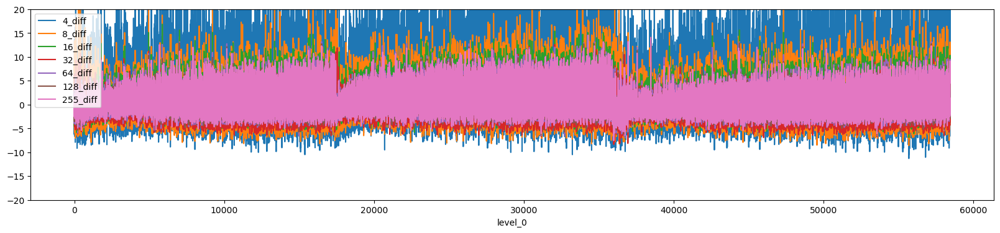

In [46]:
blue_ol_new_df.iloc[idxx].reset_index().reset_index().plot(figsize=[20, 4],x='level_0',ylim = [-20, 20], y=['4_diff', '8_diff', '16_diff', '32_diff', '64_diff', '128_diff', '255_diff'], kind='line')

In [47]:
print('all dots:', len(red_new_df))
print('overlap dots:', len(idxx))
 

all dots: 107903
overlap dots: 58439


In [48]:
print('red16 before')

print('mean', red_new_df.iloc[idxx]['16_diff'].abs().mean())

print('standard deviation', red_new_df.iloc[idxx]['16_diff'].abs().std())

print()

print('red16 after')

print('mean', red_ol_new_df.iloc[idxx]['16_diff'].abs().mean())

print('standard deviation', red_ol_new_df.iloc[idxx]['16_diff'].abs().std())



red16 before
mean 5.7518693791478785
standard deviation 5.6631443094429095

red16 after
mean 2.9422103316526425
standard deviation 2.144661076414818


In [49]:
print('red32 before')

print('mean', red_new_df.iloc[idxx]['32_diff'].abs().mean())

print('standard deviation', red_new_df.iloc[idxx]['32_diff'].abs().std())

print()

print('red32 after')

print('mean', red_ol_new_df.iloc[idxx]['32_diff'].abs().mean())

print('standard deviation', red_ol_new_df.iloc[idxx]['32_diff'].abs().std())



red32 before
mean 5.650970064909574
standard deviation 5.489079513690327

red32 after
mean 2.6309425523215153
standard deviation 1.950991945292329


In [50]:
print('red128 before')

print('mean', red_new_df.iloc[idxx]['128_diff'].abs().mean())

print('standard deviation', red_new_df.iloc[idxx]['128_diff'].abs().std())

print()

print('red128 after')

print('mean', red_ol_new_df.iloc[idxx]['128_diff'].abs().mean())

print('standard deviation', red_ol_new_df.iloc[idxx]['128_diff'].abs().std())



red128 before
mean 5.495183907965512
standard deviation 5.260313249300558

red128 after
mean 2.4369952748724346
standard deviation 1.817448966018701


In [51]:
print('green16 before')

print('mean', green_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', green_new_df.iloc[idxx]['16_diff'].std())

print()

print('green16 after')

print('mean', green_ol_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', green_ol_new_df.iloc[idxx]['16_diff'].std())
print()
print()

print('green32 before')

print('mean', green_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', green_new_df.iloc[idxx]['32_diff'].std())

print()

print('green32 after')

print('mean', green_ol_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', green_ol_new_df.iloc[idxx]['32_diff'].std())
print()
print()

print('green128 before')

print('mean', green_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', green_new_df.iloc[idxx]['128_diff'].std())

print()

print('green128 after')

print('mean', green_ol_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', green_ol_new_df.iloc[idxx]['128_diff'].std())



green16 before
mean 5.13825165233509
standard deviation 9.07430069630582

green16 after
mean 1.9644902633663346
standard deviation 2.389514268681122


green32 before
mean 4.9295387213372335
standard deviation 9.13478238331606

green32 after
mean 1.766271052438274
standard deviation 2.181521885587454


green128 before
mean 4.813053392168962
standard deviation 9.13355686071815

green128 after
mean 1.647020794631387
standard deviation 1.9810925478254149


In [52]:
print('blue16 before')

print('mean', blue_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', blue_new_df.iloc[idxx]['16_diff'].std())

print()

print('blue16 after')

print('mean', blue_ol_new_df.iloc[idxx]['16_diff'].mean())

print('standard deviation', blue_ol_new_df.iloc[idxx]['16_diff'].std())
print()
print()

print('blue32 before')

print('mean', blue_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', blue_new_df.iloc[idxx]['32_diff'].std())

print()

print('blue32 after')

print('mean', blue_ol_new_df.iloc[idxx]['32_diff'].mean())

print('standard deviation', blue_ol_new_df.iloc[idxx]['32_diff'].std())
print()
print()

print('blue128 before')

print('mean', blue_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', blue_new_df.iloc[idxx]['128_diff'].std())

print()

print('blue128 after')

print('mean', blue_ol_new_df.iloc[idxx]['128_diff'].mean())

print('standard deviation', blue_ol_new_df.iloc[idxx]['128_diff'].std())



blue16 before
mean 5.4152313769512945
standard deviation 5.808957678396847

blue16 after
mean 1.4372358810760615
standard deviation 3.0481878597868786


blue32 before
mean 3.76577489364837
standard deviation 5.092082639967203

blue32 after
mean 0.045345380392090524
standard deviation 2.6611780755845786


blue128 before
mean 4.412821148945364
standard deviation 4.748313288382379

blue128 after
mean 0.839574189332855
standard deviation 2.4888399668063883


/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:1070: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='index', ylabel='[128_diff]'>

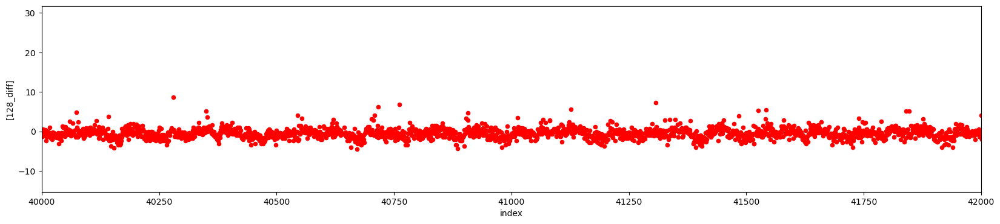

In [53]:
red_ol_new_df.reset_index().plot.scatter(figsize=[20, 4], xlim=[40000, 42000], x='index', y=['128_diff'], color='red')

<Axes: xlabel='index', ylabel='[128_diff]'>

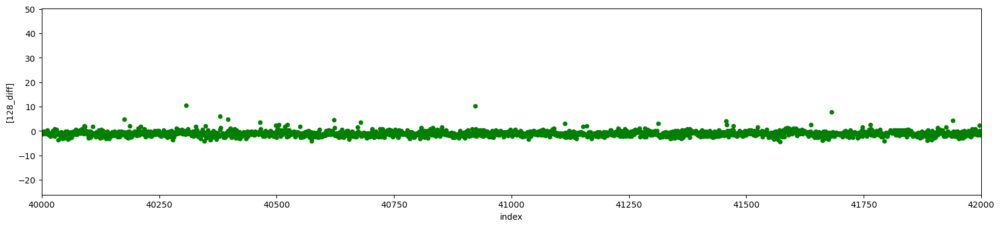

In [54]:
green_ol_new_df.reset_index().plot.scatter(figsize=[20, 4], xlim=[40000, 42000], x='index', y=['128_diff'], color='green')

<Axes: xlabel='index', ylabel='[128_diff]'>

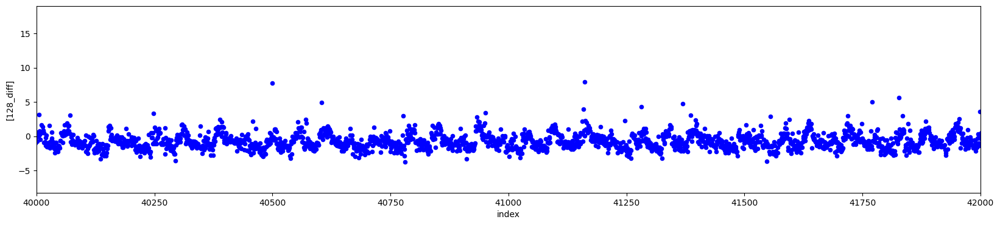

In [55]:
blue_ol_new_df.reset_index().plot.scatter(figsize=[20, 4], xlim=[40000, 42000], x='index', y=['128_diff'], color='blue')

In [67]:
print('mean', blue_ol_new_df['255_diff'].abs().std())


mean 1.4156088409695295


In [68]:
len(idxx) / len(blue_ol_new_df)

0.5356805661224826

In [77]:
print(red_ol_new_df['255_diff'].mean())
print(red_ol_new_df['128_diff'].mean())
print(red_ol_new_df['64_diff'].mean())
print(red_ol_new_df['32_diff'].mean())
print(red_ol_new_df['16_diff'].mean())
print(red_ol_new_df['8_diff'].mean())
print(red_ol_new_df['4_diff'].mean())



0.006379552480367092
0.007827452424237961
0.017519314827532186
0.031053140100338602
0.07864566799226728
0.18119529597645656
0.46925893045307704


In [69]:
print(green_ol_new_df['255_diff'].mean())
print(green_ol_new_df['128_diff'].mean())
print(green_ol_new_df['64_diff'].mean())
print(green_ol_new_df['32_diff'].mean())
print(green_ol_new_df['16_diff'].mean())
print(green_ol_new_df['8_diff'].mean())
print(green_ol_new_df['4_diff'].mean())



-0.019435235029074325
-0.017818513579558284
-0.00511653700086391
0.014149205683923029
0.07829724938687146
0.8101923645436216
0.35787214459435596


In [70]:
print(blue_ol_new_df['255_diff'].mean())
print(blue_ol_new_df['128_diff'].mean())
print(blue_ol_new_df['64_diff'].mean())
print(blue_ol_new_df['32_diff'].mean())
print(blue_ol_new_df['16_diff'].mean())
print(blue_ol_new_df['8_diff'].mean())
print(blue_ol_new_df['4_diff'].mean())



-0.0011157499769450538
-0.0061664712551119895
0.0005512409309234117
-0.04503389379950537
0.05676436355288199
-0.022118381711183258
0.532443356369442


In [71]:
print((len(red_ol_new_df[red_ol_new_df['255_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['255_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['128_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['128_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['64_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['64_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['32_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['32_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['16_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['16_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['8_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['8_diff'] > 10])) / len(red_ol_new_df))
print((len(red_ol_new_df[red_ol_new_df['4_diff'] < -10]) + len(red_ol_new_df[red_ol_new_df['4_diff'] > 10])) / len(red_ol_new_df))

0.0011769830310556703
0.0008248148800311391
0.0009730962067783102
0.0012418561115075577
0.001834981418496242
0.006644856954857604
0.0317785418385031


In [72]:
print((len(green_ol_new_df[green_ol_new_df['255_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['255_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['128_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['128_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['64_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['64_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['32_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['32_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['16_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['16_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['8_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['8_diff'] > 10])) / len(green_ol_new_df))
print((len(green_ol_new_df[green_ol_new_df['4_diff'] < -10]) + len(green_ol_new_df[green_ol_new_df['4_diff'] > 10])) / len(green_ol_new_df))

0.0016491034132816251
0.0016037983744552069
0.0014225782191495339
0.0017487744986997454
0.0027183023295850963
0.1053251542636572
0.010673867147504146


In [73]:
print((len(blue_ol_new_df[blue_ol_new_df['255_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['255_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['128_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['128_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['64_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['64_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['32_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['32_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['16_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['16_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['8_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['8_diff'] > 10])) / len(blue_ol_new_df))
print((len(blue_ol_new_df[blue_ol_new_df['4_diff'] < -10]) + len(blue_ol_new_df[blue_ol_new_df['4_diff'] > 10])) / len(blue_ol_new_df))

0.000577488931462147
0.0003116606931700476
0.00075165225999835


0.001127478389997525
0.002914944130237504
0.016728846030451085
0.06272629774595986


In [74]:
print(red_ol_new_df[(-10 < red_ol_new_df['255_diff']) & (red_ol_new_df['255_diff'] < 10)]['255_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['128_diff']) & (red_ol_new_df['128_diff'] < 10)]['128_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['64_diff']) & (red_ol_new_df['64_diff'] < 10)]['64_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['32_diff']) & (red_ol_new_df['32_diff'] < 10)]['32_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['16_diff']) & (red_ol_new_df['16_diff'] < 10)]['16_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['8_diff']) & (red_ol_new_df['8_diff'] < 10)]['8_diff'].mean())
print(red_ol_new_df[(-10 < red_ol_new_df['4_diff']) & (red_ol_new_df['4_diff'] < 10)]['4_diff'].mean())

-0.007396220363789543
-0.0018940430309344082
0.006197492817205468
0.016449980359628393
0.057776018482473615
0.11141767389744892
0.1245156605709287


In [75]:
print(green_ol_new_df[(-10 < green_ol_new_df['255_diff']) & (green_ol_new_df['255_diff'] < 10)]['255_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['128_diff']) & (green_ol_new_df['128_diff'] < 10)]['128_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['64_diff']) & (green_ol_new_df['64_diff'] < 10)]['64_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['32_diff']) & (green_ol_new_df['32_diff'] < 10)]['32_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['16_diff']) & (green_ol_new_df['16_diff'] < 10)]['16_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['8_diff']) & (green_ol_new_df['8_diff'] < 10)]['8_diff'].mean())
print(green_ol_new_df[(-10 < green_ol_new_df['4_diff']) & (green_ol_new_df['4_diff'] < 10)]['4_diff'].mean())

-0.0026364877169363435
-0.00939032008168432
-0.004298655695464796
0.01723084235264633
0.08171705402840997
1.596835974468019
0.2617562297529481


In [76]:
print(blue_ol_new_df[(-10 < blue_ol_new_df['255_diff']) & (blue_ol_new_df['255_diff'] < 10)]['255_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['128_diff']) & (blue_ol_new_df['128_diff'] < 10)]['128_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['64_diff']) & (blue_ol_new_df['64_diff'] < 10)]['64_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['32_diff']) & (blue_ol_new_df['32_diff'] < 10)]['32_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['16_diff']) & (blue_ol_new_df['16_diff'] < 10)]['16_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['8_diff']) & (blue_ol_new_df['8_diff'] < 10)]['8_diff'].mean())
print(blue_ol_new_df[(-10 < blue_ol_new_df['4_diff']) & (blue_ol_new_df['4_diff'] < 10)]['4_diff'].mean())

-0.007617111521742832
-0.009807128331105358
-0.007935900998018287
-0.05789738086240403
0.02371919841781662
-0.23701251741513576
-0.4108826284296009
